<h1><center> Loss Guided Activation for Action Recognition</center> </h1>

<br>Author: Wendell Hom
<br>Dataset: Stanford-40 action
<br>Architecture: Inception-ResNet-v2 + 
<br>Input Image Size: 500x500x3
<br>Initial Learning Rate: .0001, decrease by a factor of 10 if no improvement to validation loss


This notebook implements the approach for Action Recognition as published by this paper https://arxiv.org/pdf/1812.04194.pdf.  This model uses the Inception-ResNet-v2 model as the CNN
backbone, and then forks into two branches.  

One branch is the normal action classification branch which ends with a 40-way softmax using crossentropy loss. 
The other branch is the human localization branch which uses the mean squared error between the predicted human mask vs. the ground truth mask.  The stanford-40 image set includes a (somewhat noisy/inaccurate) bounding box of the human subject.  Pixels that lie within the bounding box will have a value of 1 and 0 otherwise.

The authors were kind enough to make some clarifications regarding the human mask loss branch when contacted via email.

Conclusion:

While one run was able to give a validation accuracy of 90%, the current run only had an accuracy of ~83% which is no better than the accuracy for our model that only has the classification branch.  Additionally, on images downloaded from the wild that is (1) from a different distribution and (2) didn't come with bounding boxes, it seems to give very poor results.


In [ ]:
import tensorflow as tf
# Using tensorboard to log data
%load_ext tensorboard
# Check to see if graphics card is doing OK memory-wise
!nvidia-smi

In [2]:
# Input image size for our CNN
pixels = 500

# batch size
BATCH_SIZE = 12

# Determines whether we load a previous model or create the model from scratch
load_model = False
model_path = "models/loss_guided_activation/15_epochs.h5"

In [3]:
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input
from sklearn import metrics
import numpy as np
import math


## Load or Create the Inception-ResNet-v2 Model

In [4]:
#
# Either load or create our model
#
if (load_model):
    
    model =load_model(model_path)

else :
    # Input pixel dimensions.  All training and test examples will be resized to (pixel, pixel, 3)
    conv_base = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(pixels,pixels,3))
    #conv_base.trainable = False

    from tensorflow.keras import layers
    from tensorflow.keras import Input
    from tensorflow.keras.models import Model

    model_input = Input(shape=(pixels, pixels, 3))
    x = conv_base(model_input)

    # classification branch
    class_branch = layers.Conv2D(1024, (3, 3), padding="same", strides=(1,1), activation="relu", name="CAM")(x)
    class_branch = layers.GlobalAveragePooling2D(name="GAP")(class_branch)
    class_output = layers.Dense(40, activation="softmax", name="class")(class_branch)

    # human localization branch
    human_branch = layers.Conv2D(512, (3, 3), padding="same", strides=(1,1), activation="relu")(x)
    human_branch = layers.Conv2D(64, (3, 3), padding="same", strides=(1,1), activation="relu")(human_branch)
    human_branch = layers.Conv2D(32, (3, 3), padding="same", strides=(1,1), activation="relu")(human_branch)
    human_output = layers.Conv2D(1, (3, 3), padding="same", strides=(1,1), activation="relu", name="mask")(human_branch)

    # The model
    model = Model(model_input, [class_output, human_output])


model.summary()

    

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 500, 500, 3) 0                                            
__________________________________________________________________________________________________
inception_resnet_v2 (Model)     (None, 14, 14, 1536) 54336736    input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_203 (Conv2D)             (None, 14, 14, 512)  7078400     inception_resnet_v2[1][0]        
__________________________________________________________________________________________________
CAM (Conv2D)                    (None, 14, 14, 1024) 14156800    inception_resnet_v2[1][0]        
______________________________________________________________________________________________

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(model, to_file='model_diagram.png', show_shapes=True, show_layer_names=True)

In [5]:
# Check out the shape of the weights of the final layer
all_amp_layer_weights = model.get_layer("class").get_weights()[0]
all_amp_layer_weights.shape

(1024, 40)

In [6]:
# Check out the feature map shape of the final Conv Layer 
cam_shape = tuple(model.get_layer("CAM").output.get_shape().as_list()[1:])
cam_shape

(14, 14, 1024)

In [7]:
mask_shape = tuple(model.get_layer("mask").output.get_shape().as_list()[1:])
mask_shape

(14, 14, 1)

## Reading annotations.csv into a dataframe

In [8]:
import pandas as pd

annotations = "dataframes/stanford40_annotations.csv"

df = pd.read_csv(annotations)
df


,filename,action,width,height,xmin,xmax,ymin,ymax,index
0,using_a_computer_062.jpg,using_a_computer,300,427,1,213,40,300,0
1,gardening_034.jpg,gardening,600,800,412,779,10,461,1
2,pushing_a_cart_126.jpg,pushing_a_cart,300,400,224,400,106,293,2
3,cooking_149.jpg,cooking,464,300,119,243,92,312,3
4,cutting_trees_148.jpg,cutting_trees,400,300,99,217,54,346,4
5,jumping_092.jpg,jumping,400,534,232,329,72,304,5
6,riding_a_bike_036.jpg,riding_a_bike,451,300,65,207,83,368,6
7,climbing_180.jpg,climbing,400,300,95,174,159,335,7
8,cutting_vegetables_078.jpg,cutting_vegetables,600,799,29,386,85,600,8
9,shooting_an_arrow_210.jpg,shooting_an_arrow,500,699,3,642,26,500,9


In [9]:
# Create dicitonaries to map from "action class" <-> "index"
action_classes = sorted(df['action'].unique())

n = 0
class_to_idx = dict()
idx_to_class = dict()

for action in action_classes:
    class_to_idx[action] = n
    n += 1
    
for action, idx in class_to_idx.items():
    idx_to_class[idx] = action



## Creating the Human Mask Label for the Human Localization Branch

In [10]:
def create_mask(row, mask_height, mask_width):
    # Image height and width
    height, width = row.height, row.width
    
    # Bounding box for the human
    xmin, xmax, ymin, ymax = row.xmin, row.xmax, row.ymin, row.ymax
    
    mask_width_ratio =  float(mask_width / width)
    mask_height_ratio = float(mask_height / height)

    mask_xmin = int(xmin * mask_width_ratio + 0.5)
    mask_xmax = int(xmax * mask_width_ratio + 0.5)
    mask_ymin = int(ymin * mask_height_ratio + 0.5)
    mask_ymax = int(ymax * mask_height_ratio + 0.5)
    
    # mask_height and mask_width is the size at the end of the human localization branch, 
    # e.g., a 14x14x1 image
    human_mask = np.zeros((mask_height, mask_width, 1))
    human_mask[mask_ymin:mask_ymax, mask_xmin:mask_xmax, 0] = 1

    return human_mask

df['mask'] = df.apply(create_mask, axis=1, mask_height=mask_shape[0], mask_width=mask_shape[1])


In [11]:
df['mask'].to_numpy()[[0,1]].shape

(2,)

## Split data into Train and Validation Sets

In [12]:
# Note: Need to be careful about reshuffling the data, especially if we load the model
# and then try to re-evaluate predictions.  This could artificially increase our accuracy because
# some of the examples in the validation set could have been in the training set when we trained it
# during a previous session

from sklearn.model_selection import train_test_split

train, validation = train_test_split(df, test_size=0.3, stratify=df['action'])


# Generate one-hot encoded labels for actions
# We'll use this inside the generator to get the class labels for each example
# This retains the original order from the dataframe and should correspond to the index that
# the generator will use to get label information
from tensorflow.keras.utils import to_categorical
actions = np.array(df['action'].map(class_to_idx))
action_labels = to_categorical(actions)


In [13]:
# Take a look at the results of train_test_split to make sure that we have
# approx 30% of examples in test
stats_df = df[['filename', 'action']].groupby(['action']).count()
stats_df['train'] = train[['filename', 'action']].groupby(['action']).agg(['count'])
stats_df['test'] = validation[['filename', 'action']].groupby(['action']).agg(['count'])
stats_df['sum'] = stats_df['test'] + stats_df['train']
stats_df['ratio'] = stats_df['test'] / stats_df['filename']

stats_df


,filename,train,test,sum,ratio
action,,,,,
applauding,284,199,85,284,0.299296
blowing_bubbles,259,181,78,259,0.301158
brushing_teeth,200,140,60,200,0.300000
cleaning_the_floor,212,148,64,212,0.301887
climbing,295,207,88,295,0.298305
cooking,288,202,86,288,0.298611
cutting_trees,203,142,61,203,0.300493
cutting_vegetables,189,132,57,189,0.301587
drinking,256,179,77,256,0.300781


## Create train and test generators

In [14]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator

image_data_generator = ImageDataGenerator(rescale=1./255)
    
train1_generator = image_data_generator.flow_from_dataframe(
    dataframe=train,
    directory='./stanford40',
    x_col='filename',
    y_col='index',
    class_mode='other',
    target_size=(pixels, pixels),
    batch_size=BATCH_SIZE  # to make this tutorial simple
)

validation1_generator = image_data_generator.flow_from_dataframe(
    dataframe=validation,
    directory='./stanford40',
    x_col='filename',
    y_col='index',
    class_mode='other',
    target_size=(pixels, pixels),
    batch_size=BATCH_SIZE  # to make this tutorial simple
)



Found 6672 validated image filenames.
Found 2860 validated image filenames.


In [15]:
# The helper function
def multilabel_flow_from_dataframe(data_generator):
    for x, y in data_generator:
        # number of indices will be equivalent to batch size
        indices = y.astype(np.int).tolist()
        
        # Get one-hot encoded action labels for this training batch
        action = action_labels[indices]
        
        # Get human mask for this training batch
        masks = df.iloc[indices]['mask'].to_numpy()
        
        mask_batch = np.zeros((len(indices), *mask_shape))
        for i, mask in enumerate(masks):
            mask_batch[i] = mask
        
        yield x, [action, mask_batch]


train_generator = multilabel_flow_from_dataframe(train1_generator)
validation_generator = multilabel_flow_from_dataframe(validation1_generator)


In [16]:
train_steps = math.ceil(len(train.index)/BATCH_SIZE)
validation_steps = math.ceil(len(validation.index)/BATCH_SIZE)

print(train_steps)
print(validation_steps)


556
239


In [17]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

# callbacks for saving best model
filepath = "models/loss_guided_activation/checkpoints/epoch_{epoch:02d}-{val_loss:.2f}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='min')

# call back for tensorboard
logdir = "models/loss_guided_activation/logs"
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)


In [18]:
model.compile(loss={'class': 'categorical_crossentropy', 'mask': 'mse'},
              loss_weights=[0.5, 0.5], optimizer=optimizers.Adam(lr=1e-4), metrics = ['acc'])


In [ ]:
# These variables are used to help add the training history into the existing tensorboard logs so that the existing history instead overwritten
prev_epochs = 0
epochs = 15

In [ ]:
# Train!
history = model.fit_generator(train_generator, steps_per_epoch=train_steps, initial_epoch=prev_epochs, epochs=epochs, 
                              validation_data=validation_generator, validation_steps=validation_steps, 
                              callbacks=[tensorboard_callback, checkpoint])

## Saving the Model

In [ ]:
model.save(f"models/loss_guided_activation/15_epochs.h5")

In [ ]:
model.summary()

## Plotting Loss and Acc

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['class_acc'])
plt.plot(history.history['val_class_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'dev'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['class_loss'])
plt.plot(history.history['val_class_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'dev'], loc='upper left')
plt.show()

## Setting Up to Generate Confusion Matrix

In [27]:
# Redefine the generators with shuffle = False
cam_shape = tuple(model.get_layer("CAM").output.get_shape().as_list()[1:])

# custom generator
def multiple_outputs(generator, image_dir, batch_size, image_size):
    gen = generator.flow_from_directory(
        image_dir,
        target_size=(image_size, image_size),
        batch_size=batch_size,
        class_mode='categorical', shuffle=False)
    
    while True:
        gnext = gen.next()
        yield gnext[0], gnext[1]

In [43]:
BATCH_SIZE = 12

pixels = 500

valid_datagen = ImageDataGenerator(rescale=1./255)

valid_generator = valid_datagen.flow_from_directory("Stanford40/test", batch_size=BATCH_SIZE, target_size=(pixels,pixels), class_mode = 'categorical', shuffle=False)

# Get the ground truth-labels, it's important that the generators had the setting shuffle = False
y_true = valid_generator.classes

# Used for calculating step size for validation set
valid_m = len(valid_generator.classes)

# Get the mapping dictionary from activity index to activity name such as "cooking"
mapping = dict()
for activity, idx in valid_generator.class_indices.items():
    mapping[idx] = activity


valid_steps = math.ceil(valid_m/BATCH_SIZE)


Found 2839 images belonging to 40 classes.


In [44]:
# Simplify the evaluation model by removing the human loss mask
evaluation_model = Model(inputs = model.input, outputs = model.get_layer("class").output)
evaluation_model.compile(loss='categorical_crossentropy', optimizer=optimizers.Adam(lr=1e-4), metrics = ['acc'])


In [30]:
a = evaluation_model.evaluate_generator(valid_generator, valid_steps)

Found 2839 images belonging to 40 classes.


In [45]:
# Run the forward pass on our validation set
predictions = evaluation_model.predict_generator(valid_generator, valid_steps)

In [46]:
# Pick the prediction to be the one with the highest probability for each image in the validation set
predictions = predictions.argmax(axis=1)

In [47]:
len(predictions)

2839

In [48]:
# Check out the accuracy for our validation set
(y_true == predictions).mean()

0.9573793589292005

In [49]:
y_true.shape

(2839,)

In [50]:
predictions[0]

0

In [51]:
# Create our matrix using sci-kit learn
matrix = metrics.confusion_matrix(y_true, predictions)

## Plot confusion matrix

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

# Let's plot the confusion matrix
df_cm = pd.DataFrame(matrix, index = [mapping[i] for i in range(40)], columns = [mapping[i] for i in range(40)])
plt.figure(figsize = (40, 40))
sn.heatmap(df_cm, annot=True)

Looking at the confusion matrix, it looks like we are doing a pretty good job at classifying the activity classes.
The areas with the most misclassifications are activities that may look similar such as:

* drinking vs. pouring liquid
* riding a bike vs. fixing a bike
* reading vs. writing on a book



## Predicting from own image

In [54]:
all_amp_layer_weights=model.get_layer("class").get_weights()[0]

In [55]:
all_amp_layer_weights.shape

(1024, 40)

In [56]:
final_model = Model(inputs = model.input, 
                  outputs = (model.get_layer("CAM").output, model.get_layer("class").output))
                    


In [57]:
final_model.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 500, 500, 3)]     0         
_________________________________________________________________
inception_resnet_v2 (Model)  (None, 14, 14, 1536)      54336736  
_________________________________________________________________
CAM (Conv2D)                 (None, 14, 14, 1024)      14156800  
_________________________________________________________________
GAP (GlobalAveragePooling2D) (None, 1024)              0         
_________________________________________________________________
class (Dense)                (None, 40)                41000     
Total params: 68,534,536
Trainable params: 68,473,992
Non-trainable params: 60,544
_________________________________________________________________


In [58]:
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

def predict(img_path, model, all_amp_layer_weights):
    
    # Load and preprocess image
    img = image.load_img(img_path, target_size=(pixels,pixels))
    
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    
    processed_input = preprocess_input(x)
    
    # Run model's prediction to output from last Conv Layer + category prediction
    last_conv_output, pred_vec = final_model.predict(processed_input)
    # Only 1 training example, so remove batch dimension
    last_conv_output = np.squeeze(last_conv_output)

    # Get category with highest probability
    pred = np.argmax(pred_vec)
    
    scale = pixels / last_conv_output.shape[0]
    filters = last_conv_output.shape[2]
    
    # Rescale to input image sizederstanding was it's reserved for the fi
    mat_for_mult = scipy.ndimage.zoom(last_conv_output, (scale,scale,1), order=1)
    
    # Get the weights associated with the predicted class
    amp_layer_weights = all_amp_layer_weights[:, pred]
    
    # Weighted sum of the activation maps for the predicted class.
    # Then resize back to original image size.
    final_output = np.dot(mat_for_mult.reshape((pixels*pixels, filters)), amp_layer_weights).reshape(pixels,pixels)
    
    return final_output, idx_to_class[pred]
    

.........................

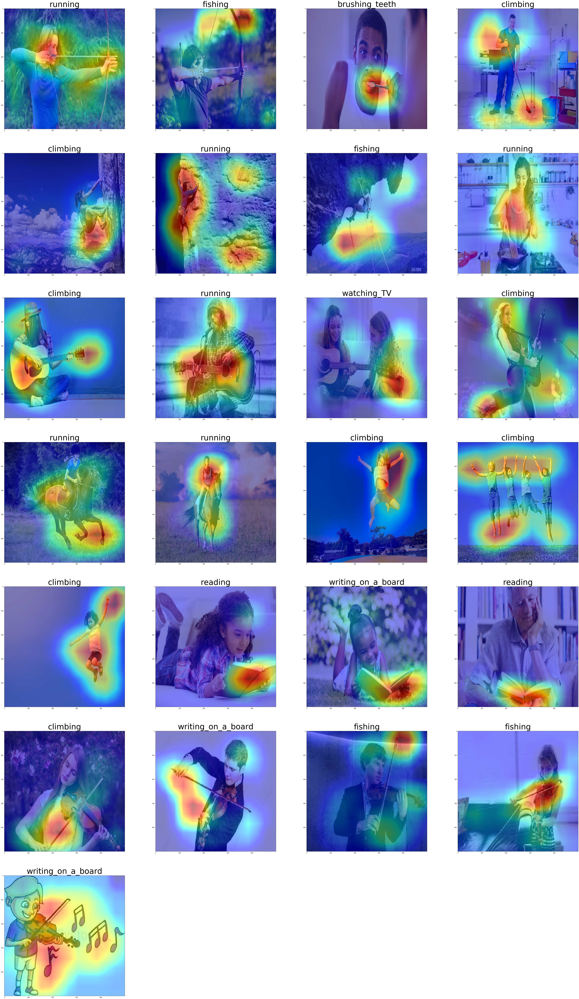

In [59]:
import matplotlib.pyplot as plt
import scipy
import glob

from tensorflow.keras.preprocessing import image

# Images downloaded from internet search engine to try out activity classification
# Images are under images/ directory 
image_dir = "images/"
pattern  = image_dir + "*"
test_images = sorted(glob.glob(pattern))

# Details for the grid size
columns = 4
rows = math.ceil(len(test_images) / columns)
fig = plt.figure(figsize=(80, 20 * rows))

for i, image_name in enumerate(test_images):

    # Progress report
    print(".", end = '')
    image_path = image_dir + image_name
    
    ax = fig.add_subplot(rows, columns, i+1)

    # Load and display original image
    img = tf.keras.preprocessing.image.load_img(image_name, target_size=(pixels,pixels))
    plt.imshow(img)
    
    # Run forward pass to get the Class Activity Map and the predicted class
    cam, pred = predict(image_name, model, all_amp_layer_weights)
    
    # Display class activation map
    plt.imshow(cam, cmap='jet', alpha=0.5)
    # Set title to that of predicted class
    ax.set_title(pred, fontsize =60)
    
    
plt.show()

In [ ]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))